Creating 15x6 subplot visualization...
Processing buildings...
Processing forest...
Processing glacier...
Processing mountain...
Processing sea...
Processing street...


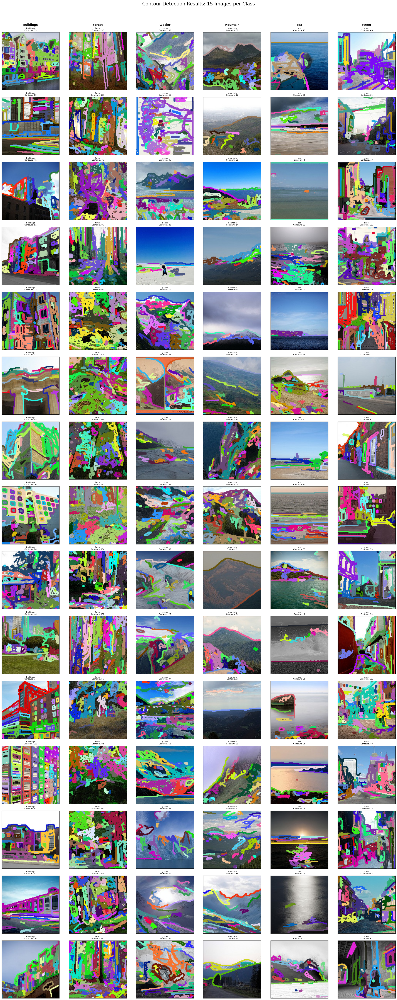

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import glob
import random
from pathlib import Path
from typing import List, Tuple, Dict, Any

# Set random seed for reproducibility
random.seed(42)
np.random.seed(42)

# Dataset configuration
DATASET_PATH = '../../../data/seg_train/seg_train'
CLASSES = ['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']
SAMPLE_IMAGES_PER_CLASS = 15

# Use the balanced configuration from contour parameter visualization
contour_config = {
    'name': 'Balanced',
    'params': {
        'gaussian_kernel': (5, 5),
        'canny_thresh1': 50,
        'canny_thresh2': 150
    }
}

def detect_contours_in_image(image_path: str, params: Dict[str, Any]) -> Tuple[List[np.ndarray], np.ndarray]:
    """
    Detect contours in an image using specified parameters.
    
    Args:
        image_path: Path to the image
        params: Dictionary containing detection parameters
        
    Returns:
        Tuple of (contours, original_image)
    """
    # Load image
    image = cv2.imread(image_path)
    if image is None:
        return [], None
    
    # Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Apply Gaussian blur
    blurred = cv2.GaussianBlur(gray, params['gaussian_kernel'], 0)
    
    # Apply Canny edge detection
    edges = cv2.Canny(blurred, params['canny_thresh1'], params['canny_thresh2'])
    
    # Find contours
    contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    return contours, image

def draw_contours_on_image(image: np.ndarray, contours: List[np.ndarray]) -> np.ndarray:
    """Draw detected contours on the image with random colors."""
    if image is None:
        return None
    
    # Convert BGR to RGB for matplotlib
    if len(image.shape) == 3:
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    else:
        image_rgb = image
    
    # Create a copy to draw on
    result = image_rgb.copy()
    
    # Draw contours with random colors
    for i, contour in enumerate(contours):
        # Generate random color
        color = (random.randint(0, 255), random.randint(0, 255), random.randint(0, 255))
        cv2.drawContours(result, [contour], -1, color, 2)
    
    return result

def load_sample_images() -> Dict[str, List[str]]:
    """
    Load sample images for each class.
    
    Returns:
        Dictionary mapping class names to lists of image paths
    """
    sample_images = {}
    
    for class_name in CLASSES:
        class_path = os.path.join(DATASET_PATH, class_name)
        if os.path.exists(class_path):
            # Get all image files
            image_files = []
            for ext in ['*.jpg', '*.jpeg', '*.png']:
                image_files.extend(glob.glob(os.path.join(class_path, ext)))
            
            # Randomly sample images
            if len(image_files) >= SAMPLE_IMAGES_PER_CLASS:
                sample_images[class_name] = random.sample(image_files, SAMPLE_IMAGES_PER_CLASS)
            else:
                sample_images[class_name] = image_files
        else:
            print(f"Warning: Class directory '{class_path}' not found")
            sample_images[class_name] = []
    
    return sample_images

def create_15x6_subplot():
    """Create a 15x6 subplot showing images with detected contours."""
    # Load sample images
    sample_images = load_sample_images()
    
    # Set up the figure
    fig, axes = plt.subplots(15, 6, figsize=(24, 60))
    fig.suptitle('Contour Detection Results: 15 Images per Class', fontsize=20, y=0.98)
    
    # Process each class (columns)
    for col_idx, class_name in enumerate(CLASSES):
        print(f"Processing {class_name}...")
        
        # Process each image in the class (rows)
        for row_idx in range(15):
            ax = axes[row_idx, col_idx]
            
            # Get the image path
            if row_idx < len(sample_images[class_name]):
                image_path = sample_images[class_name][row_idx]
                
                # Detect contours in the image
                contours, original_image = detect_contours_in_image(str(image_path), contour_config['params'])
                
                if original_image is not None:
                    # Draw contours on the image
                    image_with_contours = draw_contours_on_image(original_image, contours)
                    
                    # Display the image
                    ax.imshow(image_with_contours)
                    ax.set_title(f'{class_name}\nContours: {len(contours)}', fontsize=8)
                else:
                    ax.text(0.5, 0.5, 'Failed to load', ha='center', va='center', transform=ax.transAxes)
                    ax.set_title(f'{class_name}\nError', fontsize=8)
            else:
                ax.text(0.5, 0.5, 'No image', ha='center', va='center', transform=ax.transAxes)
                ax.set_title(f'{class_name}\nN/A', fontsize=8)
            
            # Remove axis ticks
            ax.set_xticks([])
            ax.set_yticks([])
    
    # Add column labels
    for col_idx, class_name in enumerate(CLASSES):
        axes[0, col_idx].text(0.5, 1.1, class_name.title(), 
                             ha='center', va='bottom', transform=axes[0, col_idx].transAxes,
                             fontsize=12, fontweight='bold')
    
    plt.tight_layout()
    plt.subplots_adjust(top=0.95)
    return fig

# Create the visualization
print("Creating 15x6 subplot visualization...")
fig = create_15x6_subplot()
plt.show()


In [3]:
# Side-by-side comparison of Blob Detection vs Contour Detection
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import glob
import random
from pathlib import Path

# Set random seed for reproducibility
random.seed(42)
np.random.seed(42)

def create_blob_detector(params: Dict) -> cv2.SimpleBlobDetector:
    """Create a SimpleBlobDetector with given parameters."""
    blob_params = cv2.SimpleBlobDetector_Params()
    
    # Thresholding
    blob_params.minThreshold = params.get('minThreshold', 50)
    blob_params.maxThreshold = params.get('maxThreshold', 255)
    blob_params.thresholdStep = params.get('thresholdStep', 10)
    
    # Color filtering
    blob_params.filterByColor = params.get('filterByColor', True)
    blob_params.blobColor = params.get('blobColor', 255)
    
    # Area filtering
    blob_params.filterByArea = params.get('filterByArea', True)
    blob_params.minArea = params.get('minArea', 100)
    blob_params.maxArea = params.get('maxArea', 50000)
    
    # Circularity filtering
    blob_params.filterByCircularity = params.get('filterByCircularity', True)
    blob_params.minCircularity = params.get('minCircularity', 0.1)
    blob_params.maxCircularity = params.get('maxCircularity', 1.0)
    
    # Convexity filtering
    blob_params.filterByConvexity = params.get('filterByConvexity', True)
    blob_params.minConvexity = params.get('minConvexity', 0.3)
    blob_params.maxConvexity = params.get('maxConvexity', 1.0)
    
    # Inertia ratio filtering
    blob_params.filterByInertia = params.get('filterByInertia', True)
    blob_params.minInertiaRatio = params.get('minInertiaRatio', 0.1)
    blob_params.maxInertiaRatio = params.get('maxInertiaRatio', 1.0)
    
    # Distance between blobs
    blob_params.minDistBetweenBlobs = params.get('minDistBetweenBlobs', 10)
    
    return cv2.SimpleBlobDetector_create(blob_params)

def preprocess_image_for_blob(image: np.ndarray) -> np.ndarray:
    """Preprocess image for blob detection."""
    if len(image.shape) == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    else:
        gray = image.copy()
    
    # Apply Gaussian blur and histogram equalization
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)
    equalized = cv2.equalizeHist(blurred)
    
    return equalized

def detect_blobs_in_image(image_path: str, detector: cv2.SimpleBlobDetector) -> Tuple[List, np.ndarray]:
    """Detect blobs in a single image and return keypoints and processed image."""
    image = cv2.imread(str(image_path))
    if image is None:
        return [], None
    
    processed = preprocess_image_for_blob(image)
    keypoints = detector.detect(processed)
    
    return keypoints, image

def draw_blobs_on_image(image: np.ndarray, keypoints: List) -> np.ndarray:
    """Draw detected blobs on the image."""
    if image is None:
        return None
    
    # Convert BGR to RGB for matplotlib
    if len(image.shape) == 3:
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    else:
        image_rgb = image
    
    # Draw keypoints on the image
    image_with_blobs = cv2.drawKeypoints(
        image_rgb, 
        keypoints, 
        np.array([]), 
        (0, 255, 0),  # Green color for blobs
        cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS
    )
    
    return image_with_blobs

def detect_contours_in_image(image_path: str, params: Dict[str, Any]) -> Tuple[List[np.ndarray], np.ndarray]:
    """
    Detect contours in an image using specified parameters.
    
    Args:
        image_path: Path to the image
        params: Dictionary containing detection parameters
        
    Returns:
        Tuple of (contours, original_image)
    """
    # Load image
    image = cv2.imread(image_path)
    if image is None:
        return [], None
    
    # Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Apply Gaussian blur
    blurred = cv2.GaussianBlur(gray, params['gaussian_kernel'], 0)
    
    # Apply Canny edge detection
    edges = cv2.Canny(blurred, params['canny_thresh1'], params['canny_thresh2'])
    
    # Find contours
    contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    return contours, image

def draw_contours_on_image(image: np.ndarray, contours: List[np.ndarray]) -> np.ndarray:
    """Draw detected contours on the image with random colors."""
    if image is None:
        return None
    
    # Convert BGR to RGB for matplotlib
    if len(image.shape) == 3:
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    else:
        image_rgb = image
    
    # Create a copy to draw on
    result = image_rgb.copy()
    
    # Draw contours with random colors
    for i, contour in enumerate(contours):
        # Generate random color
        color = (random.randint(0, 255), random.randint(0, 255), random.randint(0, 255))
        cv2.drawContours(result, [contour], -1, color, 2)
    
    return result

def create_side_by_side_comparison(image_path: str, title: str = "Mountain Image Comparison"):
    """
    Create a side-by-side comparison of Blob Detection (left) and Contour Detection (right)
    on the same image.
    """
    # Blob detection parameters (optimized for bright areas like snow)
    blob_params = {
        'minThreshold': 50,
        'maxThreshold': 255,
        'thresholdStep': 10,
        'filterByColor': True,
        'blobColor': 255,  # Detect bright areas (white/snow)
        'filterByArea': True,
        'minArea': 1000,
        'maxArea': 22500,
        'filterByCircularity': True,
        'minCircularity': 0.01,
        'maxCircularity': 1.0,
        'filterByConvexity': True,
        'minConvexity': 0.1,
        'maxConvexity': 1.0,
        'filterByInertia': True,
        'minInertiaRatio': 0.1,
        'maxInertiaRatio': 1.0,
        'minDistBetweenBlobs': 1
    }
    
    # Contour detection parameters (optimized for edge detection)
    contour_config = {
        'gaussian_kernel': (5, 5),
        'canny_thresh1': 50,
        'canny_thresh2': 150
    }
    
    # Create detectors
    blob_detector = create_blob_detector(blob_params)
    
    # Load and process image for blob detection
    blob_keypoints, original_image = detect_blobs_in_image(str(image_path), blob_detector)
    blob_result = draw_blobs_on_image(original_image, blob_keypoints)
    
    # Load and process image for contour detection
    contours, _ = detect_contours_in_image(str(image_path), contour_config)
    contour_result = draw_contours_on_image(original_image, contours)
    
    # Create side-by-side comparison
    fig, axes = plt.subplots(1, 2, figsize=(16, 8))
    fig.suptitle(f'Blob Detection (Left) vs Contour Detection (Right)', 
                 fontsize=16, fontweight='bold', y=0.95)
    
    # Left side: Blob Detection
    axes[0].imshow(blob_result)
    axes[0].set_title(f'Blob Detection', 
                     fontsize=12, fontweight='bold')
    axes[0].axis('off')
    
    # Right side: Contour Detection
    axes[1].imshow(contour_result)
    axes[1].set_title(f'Contour Detection', 
                     fontsize=12, fontweight='bold')
    axes[1].axis('off')

    
    plt.tight_layout()
    plt.subplots_adjust(top=0.88, bottom=0.15)
    return fig

print("Side-by-side comparison functions defined successfully!")


Side-by-side comparison functions defined successfully!


Selected mountain image: 10122.jpg
Full path: ../../../data/seg_train/seg_train\sea\10122.jpg

Creating side-by-side comparison...


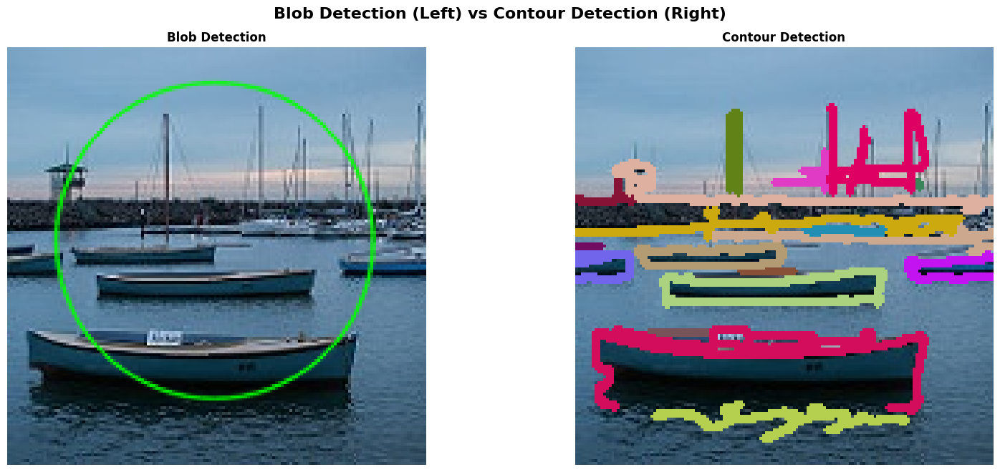


Comparison saved as: mountain_blob_vs_contour_comparison.png


In [9]:
# Load a mountain image and create the side-by-side comparison
DATASET_PATH = '../../../data/seg_train/seg_train'
MOUNTAIN_CLASS = 'sea'

# Get a sample mountain image
mountain_dir = os.path.join(DATASET_PATH, MOUNTAIN_CLASS)
mountain_images = glob.glob(os.path.join(mountain_dir, '*.jpg'))

if mountain_images:
    # Select the first mountain image
    selected_mountain_image = mountain_images[15]
    print(f"Selected mountain image: {os.path.basename(selected_mountain_image)}")
    print(f"Full path: {selected_mountain_image}")
    
    # Create the side-by-side comparison
    print("\nCreating side-by-side comparison...")
    fig = create_side_by_side_comparison(
        selected_mountain_image, 
        title=""
    )
    plt.show()
    
    # Save the comparison
    output_path = "mountain_blob_vs_contour_comparison.png"
    fig.savefig(output_path, dpi=300, bbox_inches='tight')
    print(f"\nComparison saved as: {output_path}")
    
else:
    print("No mountain images found in the dataset!")
